In [1]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from statsmodels.nonparametric.smoothers_lowess import lowess

import pymysql
pymysql.install_as_MySQLdb()
import MySQLdb
from sqlalchemy.engine.url import URL
from sqlalchemy import create_engine

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotnine import *
from plotnine.data import mtcars

In [2]:
mydb = URL(drivername='mysql', host='localhost', database="dimRed_contextualEmb", query={'read_default_file':'~/.my.cnf'})
engine = create_engine(mydb)
conn = engine.connect()

In [3]:
query_preds = f"SELECT A.group_id, A.group_norm, B.age FROM feat$p_ridg_roba_768_age$T_20$user_id A INNER JOIN 20_outcomes B ON A.group_id = B.user_id"
roba_preds = conn.execute(query_preds).fetchall()
roba_preds = pd.DataFrame(roba_preds, columns=["user_id", "roba_age", "age"])
roba_preds

,user_id,roba_age,age
0,1284923393,15.780848,15
1,100000325480401,31.151519,58
2,728505003,34.834576,57
3,565579777,20.382373,19
4,835108873,26.960924,22
...,...,...,...
4992,100001195614201,21.466179,20
4993,831905787,25.723419,21
4994,100001160634365,20.323399,16
4995,1297614982,22.327631,17


In [4]:
query_preds = f"SELECT A.group_id, A.group_norm, B.age FROM feat$p_ridg_nmf_roba_128_age$T_20$user_id A INNER JOIN 20_outcomes B ON A.group_id = B.user_id"
nmf_preds = conn.execute(query_preds).fetchall()
nmf_preds = pd.DataFrame(nmf_preds, columns=["user_id", "nmf_age", "age"])
nmf_preds

,user_id,nmf_age,age
0,1284923393,14.499116,15
1,100000325480401,32.125687,58
2,728505003,38.356504,57
3,565579777,20.279229,19
4,835108873,27.568896,22
...,...,...,...
4992,100001195614201,22.528842,20
4993,831905787,24.432163,21
4994,100001160634365,22.033484,16
4995,1297614982,19.922108,17


In [5]:
query_preds = f"SELECT A.group_id, A.group_norm, B.age FROM feat$p_ridg_rpca_roba_128_age$T_20$user_id A INNER JOIN 20_outcomes B ON A.group_id = B.user_id"
rpca_preds = conn.execute(query_preds).fetchall()
rpca_preds = pd.DataFrame(rpca_preds, columns=["user_id", "rpca_age", "age"])
rpca_preds

,user_id,rpca_age,age
0,1284923393,14.364337,15
1,100000325480401,30.155632,58
2,728505003,40.005317,57
3,565579777,20.017106,19
4,835108873,27.680446,22
...,...,...,...
4992,100001195614201,21.029969,20
4993,831905787,24.608392,21
4994,100001160634365,20.658392,16
4995,1297614982,21.051912,17


In [6]:
pearsonr(roba_preds.roba_age, roba_preds.age), pearsonr(nmf_preds.nmf_age, nmf_preds.age), pearsonr(rpca_preds.rpca_age, rpca_preds.age)

((0.8012308135904315, 0.0),
 (0.7697307684723482, 0.0),
 (0.7763261175232166, 0.0))

In [7]:
merged_preds = pd.merge(roba_preds.iloc[:, :-1], nmf_preds, on=["user_id"])
merged_preds = pd.merge(merged_preds.iloc[:, :-1], rpca_preds, on = ["user_id"])
merged_preds = merged_preds.sort_values("age")
merged_preds

,user_id,roba_age,nmf_age,rpca_age,age
1084,100001227654967,30.472699,33.787078,34.065697,13
1128,100001716038635,20.104087,21.083876,20.968623,13
2471,1132531732,16.151212,16.575981,16.475354,13
3011,100001051308947,19.526178,20.208868,20.037137,13
1941,100000389295283,13.087771,15.523235,16.084246,13
...,...,...,...,...,...
3819,772462784,40.877131,37.065145,36.245091,62
4027,1113881100,46.717618,39.758301,41.533346,62
4275,1050131359,54.401019,51.863653,50.666572,63
947,717253589,43.104007,40.561639,39.907165,63


In [8]:
query_preds = f"SELECT A.group_id, A.feat, A.value, A.group_norm FROM feat$meta_1gram$T_20$user_id$16to16 A INNER JOIN 20_outcomes B ON A.group_id = B.user_id AND B.facet_fold=1"
user_stats = conn.execute(query_preds).fetchall()
user_stats = pd.DataFrame(user_stats, columns=["user_id", "feat", "value", "group_norm"])
user_stats

,user_id,feat,value,group_norm
0,507427,_avg1gramLength,4,4.021986
1,507427,_avg1gramsPerMsg,13,13.177570
2,507427,_total1grams,1410,1410.000000
3,1237298,_avg1gramLength,2,1.997390
4,1237298,_avg1gramsPerMsg,39,38.660550
...,...,...,...,...
14995,100002308438946,_avg1gramsPerMsg,42,42.293578
14996,100002308438946,_total1grams,4610,4610.000000
14997,100002405455866,_avg1gramLength,4,4.154056
14998,100002405455866,_avg1gramsPerMsg,32,31.667732


In [9]:
user_stats_1grm_len = user_stats[user_stats.feat == "_avg1gramLength"][["user_id", "group_norm"]].reset_index(drop=True) 
user_stats_1grm_len.columns = ["user_id", "1grmLen"]
user_stats_1grm_permsg = user_stats[user_stats.feat == "_avg1gramsPerMsg"][["user_id", "group_norm"]].reset_index(drop=True)
user_stats_1grm_permsg.columns = ["user_id", "1grmPerMsg"]
user_stats_1grm_tot = user_stats[user_stats.feat == "_total1grams"][["user_id", "group_norm"]].reset_index(drop=True)
user_stats_1grm_tot.columns = ["user_id", "1grmTotal"]

In [10]:
user_stats_1grm = pd.merge(user_stats_1grm_len, user_stats_1grm_permsg, on="user_id")
user_stats_1grm = pd.merge(user_stats_1grm, user_stats_1grm_tot, on="user_id")
user_stats_1grm

,user_id,1grmLen,1grmPerMsg,1grmTotal
0,507427,4.021986,13.177570,1410.0
1,1237298,1.997390,38.660550,4214.0
2,1526541,3.895042,31.262500,10004.0
3,1935586,4.099905,16.421875,1051.0
4,2063695,4.123493,15.586639,7466.0
...,...,...,...,...
4995,100002084836097,3.833552,44.019231,2289.0
4996,100002183886566,3.953086,29.454545,1620.0
4997,100002215506152,3.859502,22.059603,3331.0
4998,100002308438946,3.921258,42.293578,4610.0


In [11]:
preds_usrstats = pd.merge(merged_preds, user_stats_1grm, on="user_id")
preds_usrstats

,user_id,roba_age,nmf_age,rpca_age,age,1grmLen,1grmPerMsg,1grmTotal
0,100001227654967,30.472699,33.787078,34.065697,13,3.569472,29.211765,2483.0
1,100001716038635,20.104087,21.083876,20.968623,13,3.861102,27.317757,2923.0
2,1132531732,16.151212,16.575981,16.475354,13,3.724964,15.233577,2087.0
3,100001051308947,19.526178,20.208868,20.037137,13,3.813069,19.819672,1209.0
4,100000389295283,13.087771,15.523235,16.084246,13,3.763688,11.350000,3178.0
...,...,...,...,...,...,...,...,...
4992,772462784,40.877131,37.065145,36.245091,62,4.266697,33.630769,2186.0
4993,1113881100,46.717618,39.758301,41.533346,62,3.880952,37.000000,1554.0
4994,1050131359,54.401019,51.863653,50.666572,63,3.742170,44.700000,1788.0
4995,717253589,43.104007,40.561639,39.907165,63,4.106621,41.912500,6706.0


In [12]:
preds_usrstats["nmf_err"] = preds_usrstats.nmf_age - preds_usrstats.age
preds_usrstats["rpca_err"] = preds_usrstats.rpca_age - preds_usrstats.age
preds_usrstats["roba_err"] = preds_usrstats.roba_age - preds_usrstats.age

preds_usrstats["nmf_err_abs"] = np.abs(preds_usrstats.nmf_age - preds_usrstats.age)
preds_usrstats["rpca_err_abs"] = np.abs(preds_usrstats.rpca_age - preds_usrstats.age)
preds_usrstats["roba_err_abs"] = np.abs(preds_usrstats.roba_age - preds_usrstats.age)

preds_usrstats["total_msgs"] = preds_usrstats["1grmTotal"]/ preds_usrstats["1grmPerMsg"]

In [13]:
nmf_err = np.abs((merged_preds.nmf_age - merged_preds.age).values)
rpca_err = np.abs((merged_preds.rpca_age - merged_preds.age).values)
age = merged_preds.age.values
len_1grm = preds_usrstats["1grmLen"].values
perMsg_1grm = preds_usrstats["1grmPerMsg"].values
total_1grm = preds_usrstats["1grmTotal"].values
total_msgs = total_1grm/ perMsg_1grm

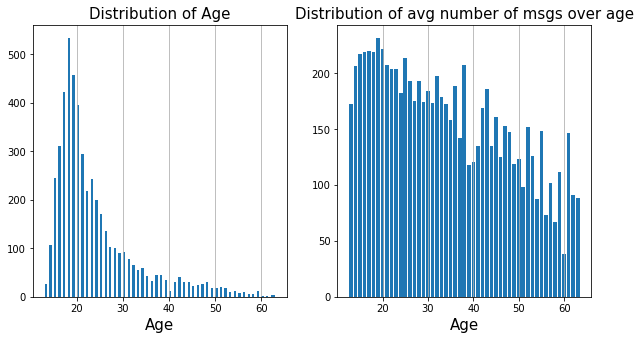

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

x = preds_usrstats.age
axs[0].hist(x, bins=100)
axs[0].grid(axis="x")
axs[0].set_title("Distribution of Age", fontsize=15)
axs[0].set_xlabel("Age", fontsize=15)

y = preds_usrstats.groupby("age").total_msgs.mean().values
x = preds_usrstats.groupby("age").total_msgs.mean().index
axs[1].bar(x, y)
axs[1].grid(axis="x")
axs[1].set_title("Distribution of avg number of msgs over age", fontsize=15)
axs[1].set_xlabel("Age", fontsize=15)

plt.show()

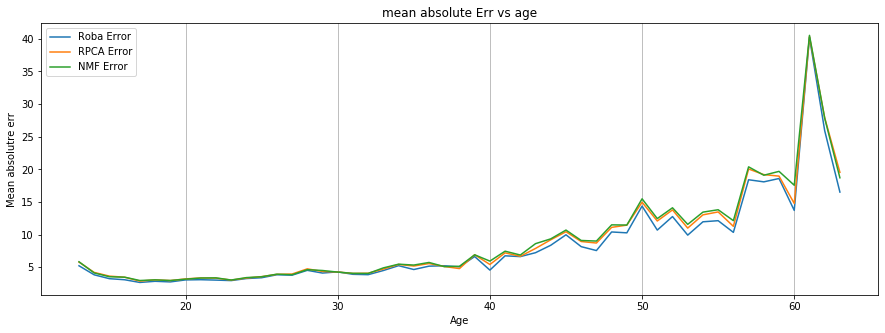

In [15]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))

x = preds_usrstats.groupby("age").roba_err_abs.mean().index
y = preds_usrstats.groupby("age").roba_err_abs.mean()
y1 = preds_usrstats.groupby("age").rpca_err_abs.mean()
y2 = preds_usrstats.groupby("age").nmf_err_abs.mean()

axs.plot(x, y, label="Roba Error")
axs.plot(x, y1, label="RPCA Error")
axs.plot(x, y2, label="NMF Error")
axs.grid(axis="x")
axs.set_title("mean absolute Err vs age")
axs.set_xlabel("Age")
axs.set_ylabel("Mean absolutre err")
axs.legend()

'''
axs[0].plot(x, y, label="Roba Error")
axs[0].set_title("Roba Error vs Age")
axs[0].grid(axis="x")
axs[0].tick_params(axis='both', which='major', labelsize=15)

axs[1].plot(x, y1, label="RPCA Error")
axs[1].set_title("RPCA Error vs Age")
axs[1].grid(axis="x")
axs[1].tick_params(axis='both', which='major', labelsize=15)

axs[2].plot(x, y2, label="NMF Error")
axs[2].set_title("NMF Error vs Age")
axs[2].grid(axis="x")
axs[2].tick_params(axis='both', which='major', labelsize=15)
'''
plt.show()

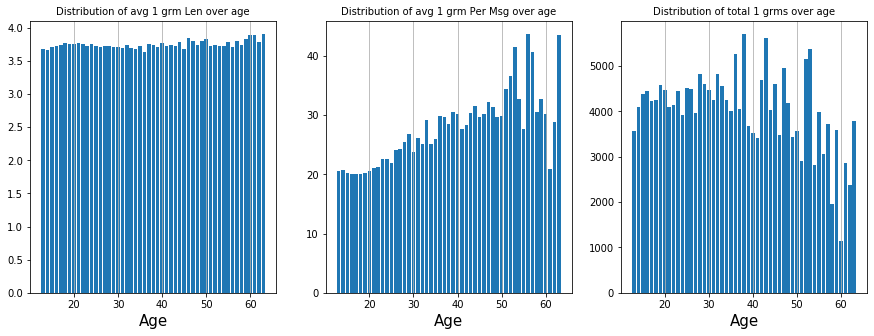

In [16]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

y = preds_usrstats.groupby("age")["1grmLen"].mean()
x = preds_usrstats.groupby("age")["1grmLen"].mean().index
axs[0].bar(x, y)
axs[0].grid(axis="x")
axs[0].set_title("Distribution of avg 1 grm Len over age", fontsize=10)
axs[0].set_xlabel("Age", fontsize=15)

y = preds_usrstats.groupby("age")["1grmPerMsg"].mean()
x = preds_usrstats.groupby("age")["1grmPerMsg"].mean().index
axs[1].bar(x, y)
axs[1].grid(axis="x")
axs[1].set_title("Distribution of avg 1 grm Per Msg over age", fontsize=10)
axs[1].set_xlabel("Age", fontsize=15)

y = preds_usrstats.groupby("age")["1grmTotal"].mean()
x = preds_usrstats.groupby("age")["1grmTotal"].mean().index
axs[2].bar(x, y)
axs[2].grid(axis="x")
axs[2].set_title("Distribution of total 1 grms over age", fontsize=10)
axs[2].set_xlabel("Age", fontsize=15)


plt.show()

(0.1078969620496507, 2.0475812360995616e-14)
(0.0714575354213892, 4.2703076463318174e-07)
(-0.07103919508151832, 4.986861511710556e-07)


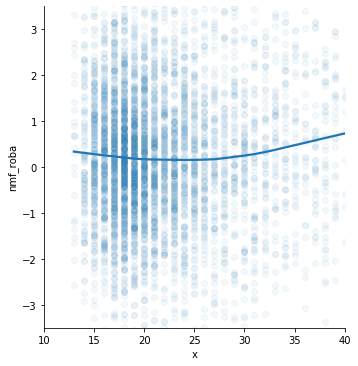

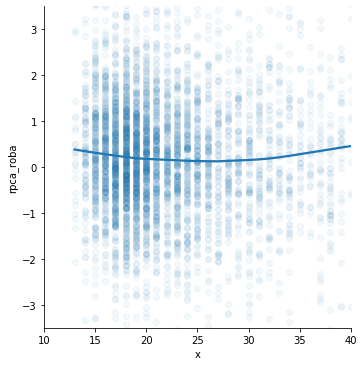

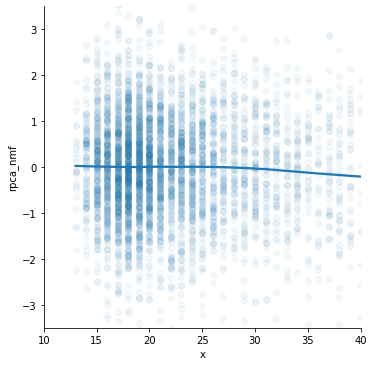

In [17]:
temp_data = preds_usrstats
temp_data["rpca_roba"] = preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs
temp_data["nmf_roba"] = preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs
temp_data["rpca_nmf"] = preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs 
temp_data["x"] = preds_usrstats["age"]
temp_data["logx"] = np.log(preds_usrstats["age"])

g = sns.lmplot(x="x", y="nmf_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.05},) #order=2,)
g = g.set(ylim=(-3.5,3.50), xlim=(10, 40))
print (pearsonr(temp_data["nmf_roba"], temp_data.x**1))

g = sns.lmplot(x="x", y="rpca_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.05},) #order=2)
g = g.set(ylim=(-3.5,3.50), xlim=(10, 40))
print (pearsonr(temp_data["rpca_roba"], temp_data.x**1))

g = sns.lmplot(x="x", y="rpca_nmf", data = temp_data, lowess=True, scatter_kws={'alpha':0.05},) #order=2)
g = g.set(ylim=(-3.5,3.50), xlim=(10, 40))
print (pearsonr(temp_data["rpca_nmf"], temp_data.x**1))

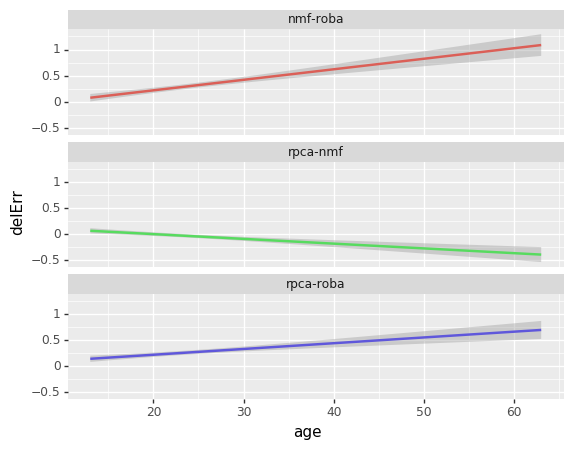

<ggplot: (8743655856276)>

In [18]:
temp = []
temp.append(pd.concat([preds_usrstats[["user_id", "age"]], preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "age"]], preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "age"]], preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp_data = pd.concat(temp, axis=0)
temp_data.columns = ["user_id", "age", "delErr"]
temp_data["delErr_type"] = None
temp_data = temp_data.reset_index(drop=True)
temp_data.loc[temp_data.index<4997, "delErr_type"] = "rpca-nmf"
temp_data.loc[(temp_data.index>=4997)& (temp_data.index<(2*4997)), "delErr_type"] = "rpca-roba"
temp_data.loc[temp_data.index>=(2*4997), "delErr_type"] = "nmf-roba"


(
    ggplot(temp_data, aes(x='age', y='delErr', color="delErr_type"))
    + geom_smooth(span=0.2, show_legend=False)
    #+ coord_cartesian(ylim = (-4,4))
    + facet_wrap("delErr_type", ncol=1)
    
)



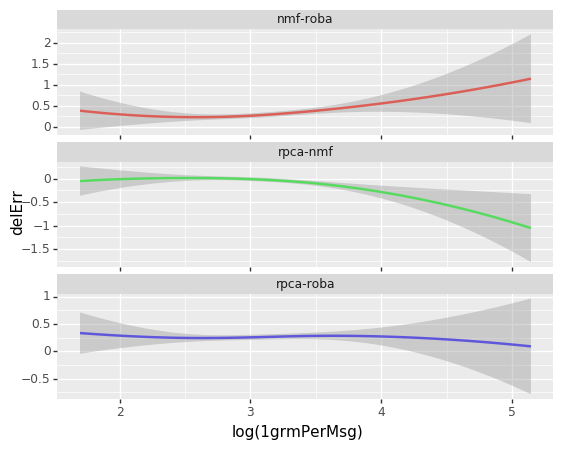

<ggplot: (8743648504633)>

In [40]:
temp = []
temp.append(pd.concat([preds_usrstats[["user_id", "1grmPerMsg"]], preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "1grmPerMsg"]], preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "1grmPerMsg"]], preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp_data = pd.concat(temp, axis=0)
temp_data.columns = ["user_id", "1grmPerMsg", "delErr"]
temp_data["delErr_type"] = None
temp_data = temp_data.reset_index(drop=True)
temp_data.loc[temp_data.index<4997, "delErr_type"] = "rpca-nmf"
temp_data.loc[(temp_data.index>=4997)& (temp_data.index<(2*4997)), "delErr_type"] = "rpca-roba"
temp_data.loc[temp_data.index>=(2*4997), "delErr_type"] = "nmf-roba"
temp_data["log(1grmPerMsg)"] = np.log(temp_data["1grmPerMsg"])


(
    ggplot(temp_data, aes(x='log(1grmPerMsg)', y='delErr', color="delErr_type"))
    + geom_smooth(span=1.0, show_legend=False, method="loess")
    + facet_wrap("delErr_type", ncol=1, scales="free")
    
)



In [26]:
temp_data[["log(1grmPerMsg)", "delErr", "delErr_type"]]

,log(1grmPerMsg),delErr,delErr_type
0,3.374572,0.278619,rpca-nmf
1,3.307537,-0.115253,rpca-nmf
2,2.723502,-0.100627,rpca-nmf
3,2.986675,-0.171731,rpca-nmf
4,2.429218,0.561011,rpca-nmf
...,...,...,...
14986,3.515441,3.811986,nmf-roba
14987,3.610918,6.959317,nmf-roba
14988,3.799974,2.537366,nmf-roba
14989,3.735584,2.542367,nmf-roba


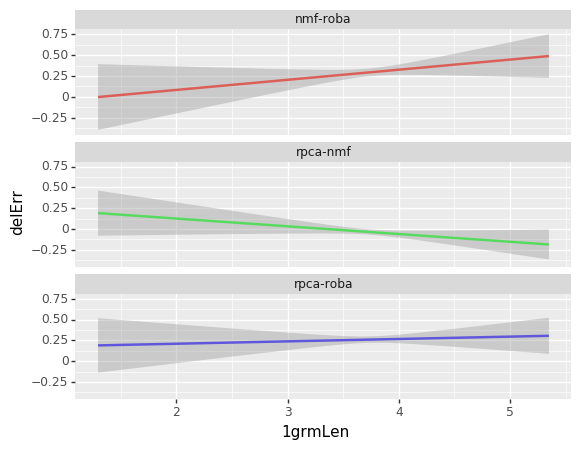

<ggplot: (-9223363293203388188)>

In [20]:
temp = []
temp.append(pd.concat([preds_usrstats[["user_id", "1grmLen"]], preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "1grmLen"]], preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "1grmLen"]], preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp_data = pd.concat(temp, axis=0)
temp_data.columns = ["user_id", "1grmLen", "delErr"]
temp_data["delErr_type"] = None
temp_data = temp_data.reset_index(drop=True)
temp_data.loc[temp_data.index<4997, "delErr_type"] = "rpca-nmf"
temp_data.loc[(temp_data.index>=4997)& (temp_data.index<(2*4997)), "delErr_type"] = "rpca-roba"
temp_data.loc[temp_data.index>=(2*4997), "delErr_type"] = "nmf-roba"
temp_data["log(1grmLen)"] = np.log(temp_data["1grmLen"])

(
    ggplot(temp_data, aes(x='1grmLen', y='delErr', color="delErr_type"))
    + geom_smooth(span=0.2, show_legend=False)
    + facet_wrap("delErr_type", ncol=1)
    
)



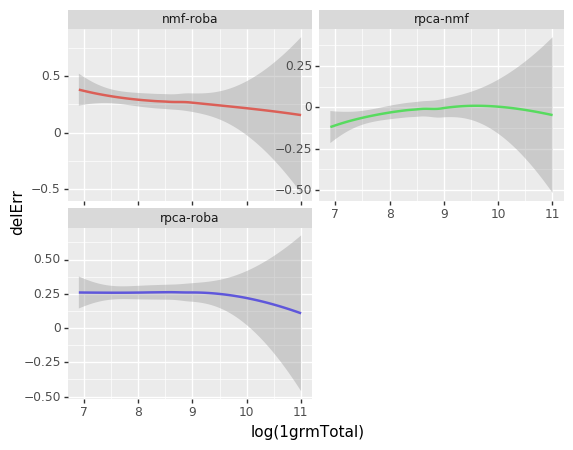

<ggplot: (8743647457635)>

In [44]:
temp = []
temp.append(pd.concat([preds_usrstats[["user_id", "1grmTotal"]], preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "1grmTotal"]], preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp.append(pd.concat([preds_usrstats[["user_id", "1grmTotal"]], preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs], axis=1))
temp_data = pd.concat(temp, axis=0)
temp_data.columns = ["user_id", "1grmTotal", "delErr"]
temp_data["delErr_type"] = None
temp_data = temp_data.reset_index(drop=True)
temp_data.loc[temp_data.index<4997, "delErr_type"] = "rpca-nmf"
temp_data.loc[(temp_data.index>=4997)& (temp_data.index<(2*4997)), "delErr_type"] = "rpca-roba"
temp_data.loc[temp_data.index>=(2*4997), "delErr_type"] = "nmf-roba"
temp_data["log(1grmTotal)"] = np.log(temp_data["1grmTotal"])


(
    ggplot(temp_data, aes(x='log(1grmTotal)', y='delErr', color="delErr_type"))
    + geom_smooth(span=1.0, show_legend=False, method="loess")
    + facet_wrap("delErr_type", ncol=2, scales="free")
    
)



(0.0405351070982299, 0.004158704403413983)
(0.010259312021697357, 0.46841345046324345)
(-0.04665999764548677, 0.0009691179863427433)


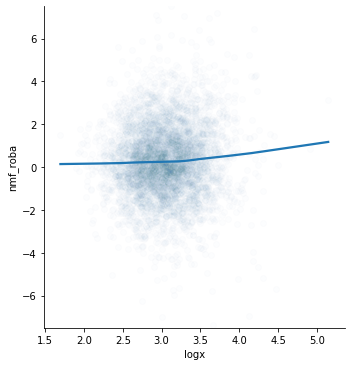

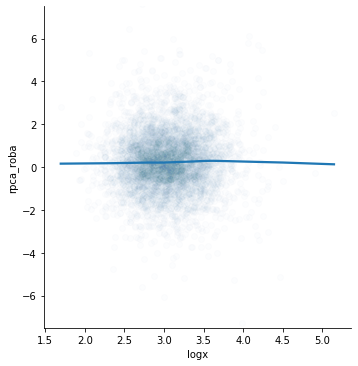

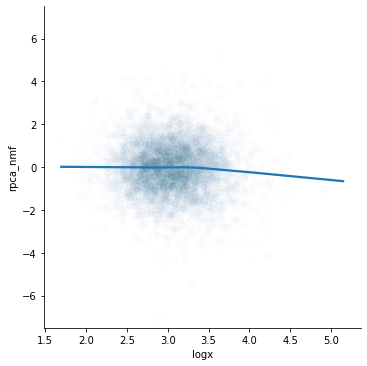

In [46]:
    temp_data = preds_usrstats
    temp_data["rpca_roba"] = (preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs)**1
    temp_data["nmf_roba"] = (preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs)**1
    temp_data["rpca_nmf"] = (preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs)**1
    temp_data["x"] = preds_usrstats["1grmPerMsg"]
    temp_data["logx"] = np.log(preds_usrstats["1grmPerMsg"])

    g = sns.lmplot(x="logx", y="nmf_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=1, truncate=True)
    g = g.set(ylim=(-7.5,7.50))
    #g = g.set(ylim=(-.25,20))
    print (pearsonr(temp_data["nmf_roba"], temp_data.logx**1))

    g = sns.lmplot(x="logx", y="rpca_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=1, truncate=True)
    g = g.set(ylim=(-7.5,7.50))
    #g = g.set(ylim=(-0.25,10))
    print (pearsonr(temp_data["rpca_roba"], temp_data.logx**1))

    g = sns.lmplot(x="logx", y="rpca_nmf", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=1, truncate=True)
    g = g.set(ylim=(-7.5,7.50))
    #g = g.set(ylim=(-0.25,10))
    print (pearsonr(temp_data["rpca_nmf"], temp_data.logx**1))

(0.11316448766105422, 1.0292517927036582e-15)
(0.06342465189377407, 7.2283752339026715e-06)
(0.08309778277196934, 4.032753525948393e-09)


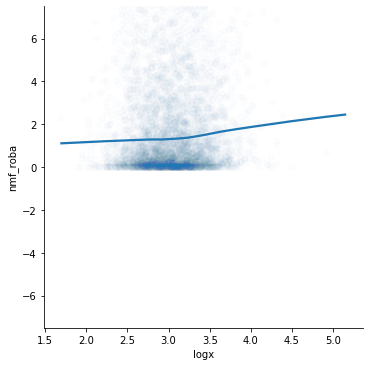

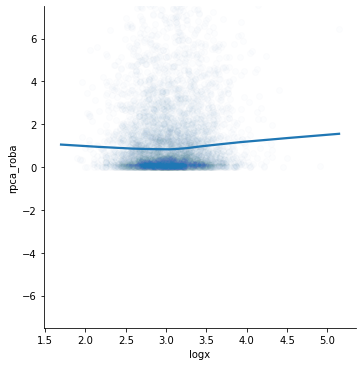

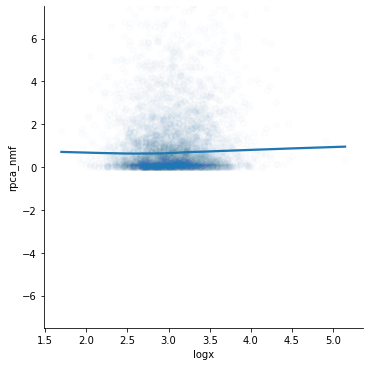

In [45]:
    temp_data = preds_usrstats
    temp_data["rpca_roba"] = (preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs)**2
    temp_data["nmf_roba"] = (preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs)**2
    temp_data["rpca_nmf"] = (preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs)**2
    temp_data["x"] = preds_usrstats["1grmPerMsg"]
    temp_data["logx"] = np.log(preds_usrstats["1grmPerMsg"])

    g = sns.lmplot(x="logx", y="nmf_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=1, truncate=True)
    g = g.set(ylim=(-7.5,7.50))
    #g = g.set(ylim=(-.25,20))
    print (pearsonr(temp_data["nmf_roba"], temp_data.logx**1))

    g = sns.lmplot(x="logx", y="rpca_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=1, truncate=True)
    g = g.set(ylim=(-7.5,7.50))
    #g = g.set(ylim=(-0.25,10))
    print (pearsonr(temp_data["rpca_roba"], temp_data.logx**1))

    g = sns.lmplot(x="logx", y="rpca_nmf", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=1, truncate=True)
    g = g.set(ylim=(-7.5,7.50))
    #g = g.set(ylim=(-0.25,10))
    print (pearsonr(temp_data["rpca_nmf"], temp_data.logx**1))

(0.021485681573670656, 0.12886155446552994)
(0.006401769724779682, 0.6509599042975838)
(-0.023571640150587284, 0.0956972506507537)


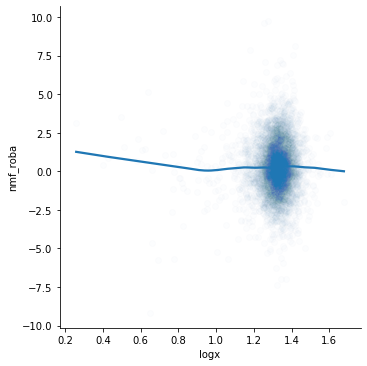

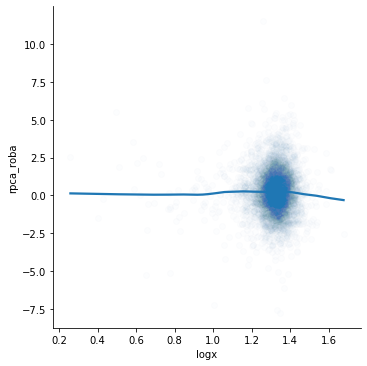

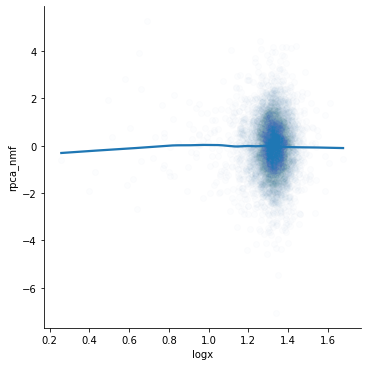

In [32]:
    temp_data = preds_usrstats
    temp_data["rpca_roba"] = preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs
    temp_data["nmf_roba"] = preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs
    temp_data["rpca_nmf"] = preds_usrstats.rpca_err_abs - preds_usrstats.nmf_err_abs 
    temp_data["x"] = preds_usrstats["1grmLen"]
    temp_data["logx"] = np.log(preds_usrstats["1grmLen"])

    sns.lmplot(x="logx", y="nmf_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=2)
    print (pearsonr(temp_data["nmf_roba"], temp_data.logx))

    sns.lmplot(x="logx", y="rpca_roba", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=2)
    print (pearsonr(temp_data["rpca_roba"], temp_data.logx))

    sns.lmplot(x="logx", y="rpca_nmf", data = temp_data, lowess=True, scatter_kws={'alpha':0.01},) #order=2)
    print (pearsonr(temp_data["rpca_nmf"], temp_data.logx))

(-0.018884195930244763, 0.1819749840160031)
(-0.0008465390791779094, 0.9522938739761164)


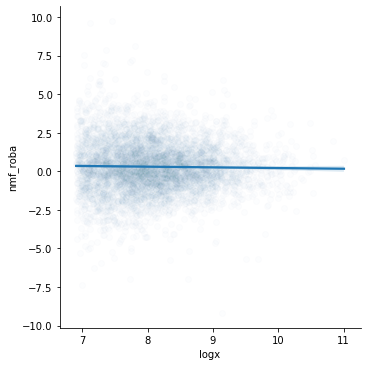

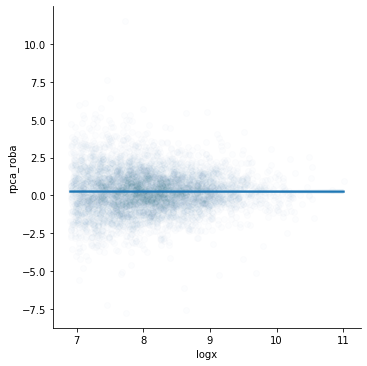

In [21]:
    temp_data = preds_usrstats
    temp_data["rpca_roba"] = preds_usrstats.rpca_err_abs - preds_usrstats.roba_err_abs
    temp_data["nmf_roba"] = preds_usrstats.nmf_err_abs - preds_usrstats.roba_err_abs
    temp_data["x"] = preds_usrstats["1grmTotal"]
    temp_data["logx"] = np.log(preds_usrstats["1grmTotal"])

    sns.lmplot(x="logx", y="nmf_roba", data = temp_data, lowess=False, scatter_kws={'alpha':0.01}, order=True)
    print (pearsonr(temp_data["nmf_roba"], temp_data.logx))

    sns.lmplot(x="logx", y="rpca_roba", data = temp_data, lowess=False, scatter_kws={'alpha':0.01}, order=True)
    print (pearsonr(temp_data["rpca_roba"], temp_data.logx))

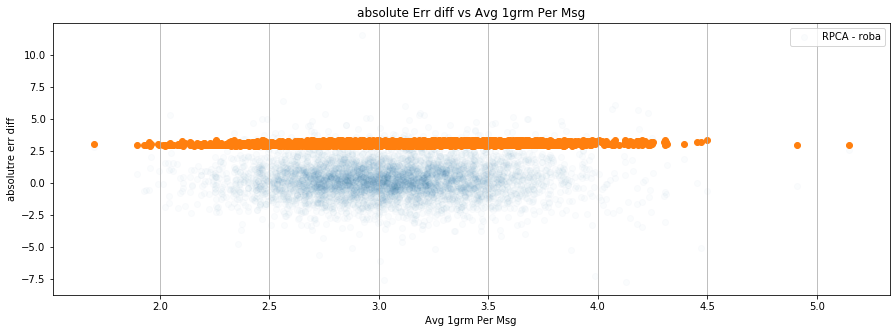

(0.010259312021697357, 0.46841345046324345)


In [62]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))

x_ = preds_usrstats["1grmPerMsg"]
x = np.log(x_)
y = preds_usrstats.roba_err_abs
y1 = preds_usrstats.rpca_err_abs
y2 = preds_usrstats.nmf_err_abs

#axs.plot(x, y, label="Roba Error")
#axs.plot(x, y1, label="RPCA Error")
#axs.plot(x, y2, label="NMF Error")
axs.scatter(x, y1-y, label="RPCA - roba", alpha=0.02)
W = np.polyfit(x, y1-y, 2)
#y_ = np.dot(np.concatenate([(x**2).values.reshape(-1,1), x.values.reshape(-1,1), np.ones((x.shape[0], 1))], axis=1 ), W.T)
y_ = lowess(x, y, frac=0.25, it=2, return_sorted=False)
axs.scatter(x, y_)
axs.grid(axis="x")
axs.set_title("absolute Err diff vs Avg 1grm Per Msg")
axs.set_xlabel("Avg 1grm Per Msg")
axs.set_ylabel("absolutre err diff")
axs.set_xlim()
axs.legend()
plt.show()
print (pearsonr(x, y1-y))

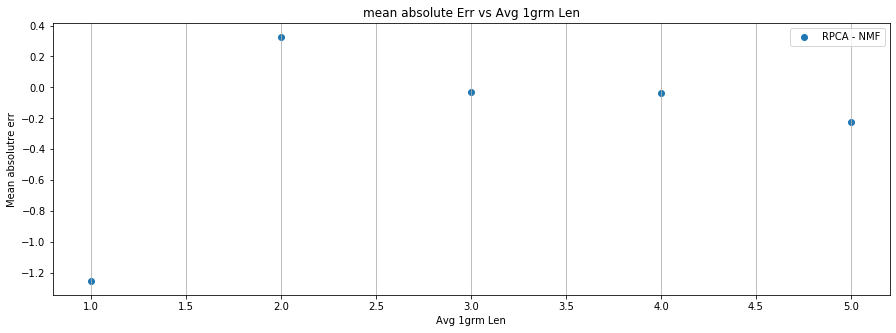

In [21]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))

x = preds_usrstats.groupby("1grmLen").roba_err_abs.mean().index
y = preds_usrstats.groupby("1grmLen").roba_err_abs.mean()
y1 = preds_usrstats.groupby("1grmLen").rpca_err_abs.mean()
y2 = preds_usrstats.groupby("1grmLen").nmf_err_abs.mean()

#axs.plot(x, y, label="Roba Error")
#axs.plot(x, y1, label="RPCA Error")
#axs.plot(x, y2, label="NMF Error")
axs.scatter(x, y1-y2, label="RPCA - NMF")
axs.grid(axis="x")
axs.set_title("mean absolute Err vs Avg 1grm Len")
axs.set_xlabel("Avg 1grm Len")
axs.set_ylabel("Mean absolutre err")
axs.legend()
plt.show()

- Mostly full model is better than RPCA over avg 1 gram length. 
- NMF is as good as or better than RPCA when the users' avg 1 gram length is b.w 2-4

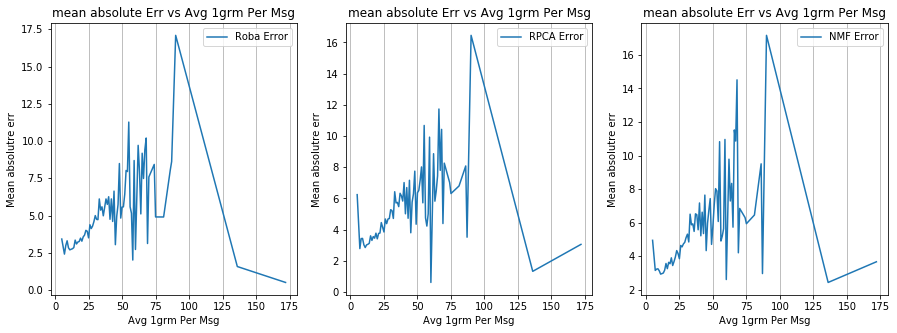

In [86]:
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
x = preds_usrstats.groupby("1grmPerMsg").roba_err_abs.mean().index
y = preds_usrstats.groupby("1grmPerMsg").roba_err_abs.mean()
y1 = preds_usrstats.groupby("1grmPerMsg").rpca_err_abs.mean()
y2 = preds_usrstats.groupby("1grmPerMsg").nmf_err_abs.mean()

axs[0].plot(x, y, label="Roba Error")
axs[0].grid(axis="x")
axs[0].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs[0].set_xlabel("Avg 1grm Per Msg")
axs[0].set_ylabel("Mean absolutre err")
axs[0].legend()

axs[1].plot(x, y1, label="RPCA Error")
axs[1].grid(axis="x")
axs[1].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs[1].set_xlabel("Avg 1grm Per Msg")
axs[1].set_ylabel("Mean absolutre err")
axs[1].legend()

axs[2].plot(x, y2, label="NMF Error")
axs[2].grid(axis="x")
axs[2].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs[2].set_xlabel("Avg 1grm Per Msg")
axs[2].set_ylabel("Mean absolutre err")
axs[2].legend()

plt.show()

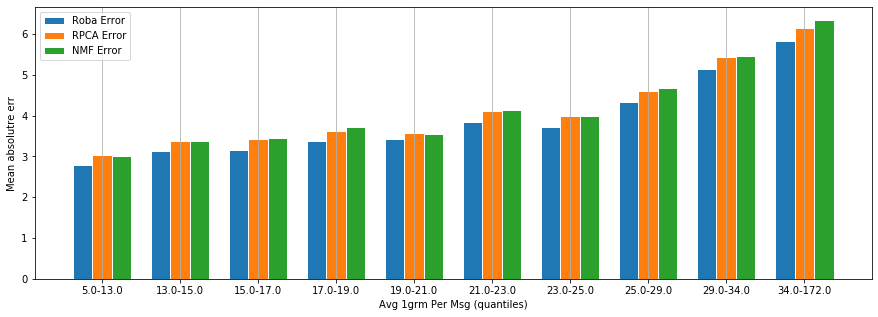

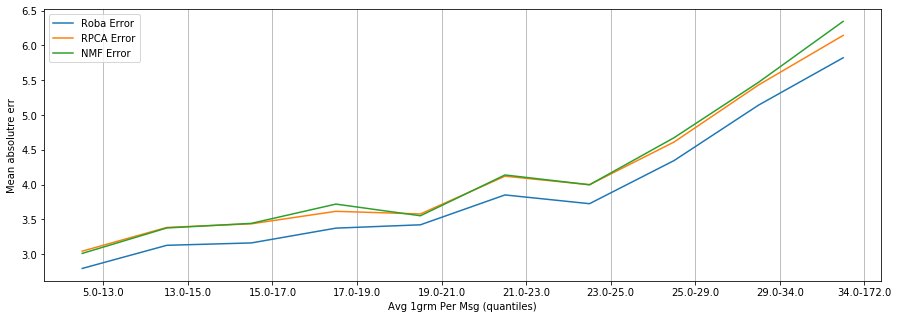

In [121]:
y, y1, y2 = [], [], []
x = []
num_bins = 10
for i in range(num_bins):
    lower, upper = i*1/num_bins, min(1, (i+1)/num_bins)
    lower_quant, upper_quant = preds_usrstats["1grmPerMsg"].quantile(lower), preds_usrstats["1grmPerMsg"].quantile(upper)
    quantile_data = preds_usrstats[(preds_usrstats["1grmPerMsg"] > lower_quant) & (preds_usrstats["1grmPerMsg"] <= upper_quant)]
    y.append(quantile_data.roba_err_abs.mean())
    y1.append(quantile_data.rpca_err_abs.mean())
    y2.append(quantile_data.nmf_err_abs.mean())
    x.append(f"{lower_quant}-{upper_quant}")

barWidth = 0.25
x_ = np.arange(len(y))
x1_ = [a + barWidth for a in x_]
x2_ = [a + barWidth for a in x1_]

fig, axs = plt.subplots(1, 1, figsize=(15, 5))
axs.bar(x_, y, label="Roba Error", width=barWidth, edgecolor='white')
axs.bar(x1_, y1, label="RPCA Error", width=barWidth, edgecolor='white')
axs.bar(x2_, y2, label="NMF Error", width=barWidth, edgecolor='white')
axs.grid(axis="x")
#axs[0].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs.set_xlabel("Avg 1grm Per Msg (quantiles)")
axs.set_ylabel("Mean absolutre err")
axs.legend()
plt.xticks([r + barWidth for r in range(len(y))], x) 
plt.show()


x_ = np.arange(len(y))
x1_ = [a + barWidth for a in x_]
x2_ = [a + barWidth for a in x1_]

fig, axs = plt.subplots(1, 1, figsize=(15, 5))
axs.plot(x_, y, label="Roba Error")
axs.plot(x_, y1, label="RPCA Error")
axs.plot(x_, y2, label="NMF Error")
axs.grid(axis="x")
#axs[0].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs.set_xlabel("Avg 1grm Per Msg (quantiles)")
axs.set_ylabel("Mean absolutre err")
axs.legend()
plt.xticks([r + barWidth for r in range(len(y))], x) 
plt.show()

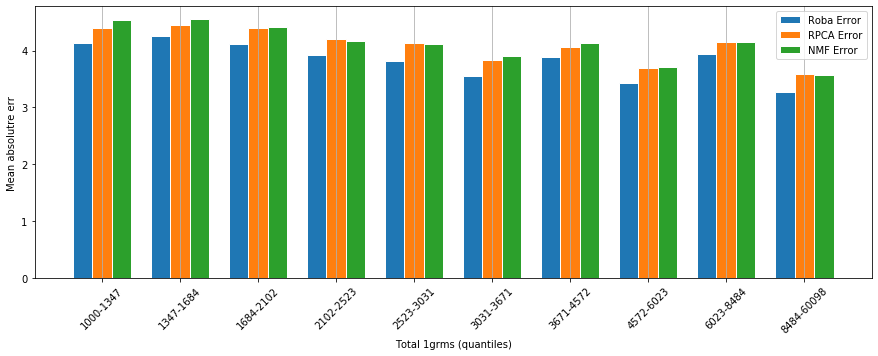

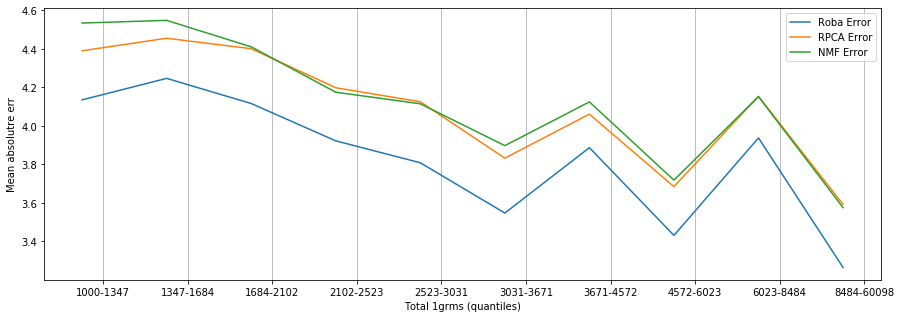

In [120]:
y, y1, y2 = [], [], []
x = []
num_bins = 10
for i in range(num_bins):
    lower, upper = i*1/num_bins, min(1, (i+1)/num_bins)
    lower_quant, upper_quant = preds_usrstats["1grmTotal"].quantile(lower), preds_usrstats["1grmTotal"].quantile(upper)
    quantile_data = preds_usrstats[(preds_usrstats["1grmTotal"] > lower_quant) & (preds_usrstats["1grmTotal"] <= upper_quant)]
    y.append(quantile_data.roba_err_abs.mean())
    y1.append(quantile_data.rpca_err_abs.mean())
    y2.append(quantile_data.nmf_err_abs.mean())
    x.append(f"{int(lower_quant)}-{int(upper_quant)}")

barWidth = 0.25
x_ = np.arange(len(y))
x1_ = [a + barWidth for a in x_]
x2_ = [a + barWidth for a in x1_]

fig, axs = plt.subplots(1, 1, figsize=(15, 5))
axs.bar(x_, y, label="Roba Error", width=barWidth, edgecolor='white')
axs.bar(x1_, y1, label="RPCA Error", width=barWidth, edgecolor='white')
axs.bar(x2_, y2, label="NMF Error", width=barWidth, edgecolor='white')
axs.grid(axis="x")
#axs[0].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs.set_xlabel("Total 1grms (quantiles)")
axs.set_ylabel("Mean absolutre err")
axs.legend()
plt.xticks([r + barWidth for r in range(len(y))], x, rotation=45) 
plt.show()

x_ = np.arange(len(y))
x1_ = [a + barWidth for a in x_]
x2_ = [a + barWidth for a in x1_]

fig, axs = plt.subplots(1, 1, figsize=(15, 5))
axs.plot(x_, y, label="Roba Error")
axs.plot(x_, y1, label="RPCA Error")
axs.plot(x_, y2, label="NMF Error")
axs.grid(axis="x")
#axs[0].set_title("mean absolute Err vs Avg 1grm Per Msg")
axs.set_xlabel("Total 1grms (quantiles)")
axs.set_ylabel("Mean absolutre err")
axs.legend()
plt.xticks([r + barWidth for r in range(len(y))], x) 
plt.show()

To DO: Correlation matrix

| N_{ta} | Model       | Age  | Gen  |
|--------|-------------|------|------|
| 100    | Fine Tune   | 0.54 | 0.54 |
|        | Pre-Trained | 0.52 | 0.61 |
| 500    | Fine Tune   | 0.64 | 0.60 |
|        | Pre-Trained | 0.64 | 0.74 |

In [115]:
data = pd.read_csv("./ErrorAnalysis/RPCA_RobadeltaError1grams.age.csv", skiprows=3)
data.head()

,feature,del_rpca_roba_abs,p,N,CI_l,CI_u,freq
0,!,0.010850,0.863861,4997,-0.016882,0.038566,973785
1,"""",0.008507,0.898003,4997,-0.019225,0.036226,154560
2,#,0.005255,0.935303,4997,-0.022476,0.032978,3211
3,$,0.000482,0.991391,4997,-0.027246,0.028210,7054
4,%,0.002628,0.968921,4997,-0.025102,0.030353,6921


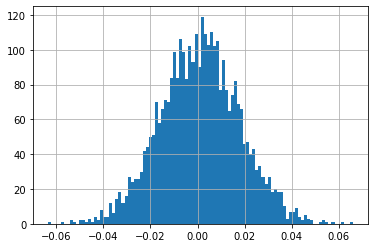

In [116]:
data.del_rpca_roba_abs.hist(bins=100)

In [119]:
data.sort_values(["p", "freq"], ascending=True).sort_values("del_rpca_roba_abs", ascending=False).head(20)

,feature,del_rpca_roba_abs,p,N,CI_l,CI_u,freq
659,christmas,0.065953,0.010671,4997,0.038295,0.093509,9527
1290,gf,0.062007,0.013356,4997,0.034338,0.089580,381
2175,out,0.058043,0.034050,4997,0.030364,0.085632,60596
2453,record,0.055073,0.054179,4997,0.027387,0.082675,854
1331,government,0.053867,0.054179,4997,0.026178,0.081472,937
954,drive,0.053222,0.058128,4997,0.025532,0.080831,3384
587,cartoon,0.052772,0.060011,4997,0.025081,0.080382,844
2986,the,0.048360,0.131785,4997,0.020660,0.075986,500093
2733,snow,0.048348,0.131785,4997,0.020648,0.075974,6737
1478,hit,0.047643,0.138050,4997,0.019942,0.075271,4646
